# Loading the tweets & general impression

In [1]:
from os import listdir
from os.path import isfile, join
import math
import json
import numpy as np
import pandas as pd


mypath = '../data/Server'
onlyfiles = [f for f in listdir(mypath) if isfile(join(mypath, f))]

all_tweets = []

for f in onlyfiles:
    full_name = mypath+'/'+f
    if full_name == '../data/Server/.DS_Store':
        continue
    # print(full_name)
    with open(full_name, 'r') as f:
        data = json.load(f)
        all_tweets.extend(data)
        
data = all_tweets
print(len(all_tweets))

filtered_data = []
count = 0

for tweet in data:
    if('text' in tweet.keys()):
        if  'Came across this campaign by farmers' not in tweet['text']: # this works for 
            filtered_data.append(tweet)
            # count += 1
            
print (len(filtered_data))

103500
101902


In [5]:
# Amount of Hashtags

# Adapted from "Mastering Social Media Mining with Python" - Marco Bonzanini, 2016
# %load twitter_hashtag_stats.py
# Chap02-03/twitter_hashtag_stats.py


import sys
from collections import defaultdict
import json

def get_hashtags(tweet):
    entities = tweet.get('entities', {})
    hashtags = entities.get('hashtags', [])
    return [tag['text'].lower() for tag in hashtags]

def usage():
    print("Usage:")
    print("python {} <filename.jsonl>".format(sys.argv[0]))

hashtag_count = defaultdict(int)

for tweet in all_tweets:    
    hashtags_in_tweet = get_hashtags(tweet)
    n_of_hashtags = len(hashtags_in_tweet)
    hashtag_count[n_of_hashtags] += 1
    
    tweets_with_hashtags = sum([count for n_of_tags, count in hashtag_count.items() if n_of_tags > 0])
    tweets_no_hashtags = hashtag_count[0]
    tweets_total = tweets_no_hashtags + tweets_with_hashtags
    tweets_with_hashtags_percent = "%.2f" % (tweets_with_hashtags / tweets_total * 100)
    tweets_no_hashtags_percent = "%.2f" % (tweets_no_hashtags / tweets_total * 100)

print("{} tweets without hashtags ({}%)".format(tweets_no_hashtags, tweets_no_hashtags_percent))
print("{} tweets with at least one hashtag ({}%)".format(tweets_with_hashtags, tweets_with_hashtags_percent))

for tag_count, tweet_count in hashtag_count.items():
    if tag_count > 0:
        percent_total = "%.2f" % (tweet_count / tweets_total * 100)
        percent_elite = "%.2f" % (tweet_count / tweets_with_hashtags * 100)

print("{} tweets with {} hashtags ({}% total)".format(tweet_count, tag_count, percent_total))
#print("{} tweets with {} hashtags ({}% total, {}% elite)".format(tweet_count, tag_count, percent_total, percent_elite))

64718 tweets without hashtags (62.53%)
38782 tweets with at least one hashtag (37.47%)
1 tweets with 12 hashtags (0.00% total)


In [6]:
# Unique users

from collections import Counter

user_names = []

for tweet in filtered_data:
    if ('user' in tweet.keys()):
        user_name = tweet['user']['screen_name']
        user_names.append(user_name)
        
x = Counter(user_names)
x.most_common(10)

print(len(x)) 

65417


In [7]:
# Languages

from collections import Counter

language = []

for tweet in filtered_data:
    if ('user' in tweet.keys()):
        lang = tweet['user']['lang']
        language.append(lang)
        
x = Counter(language)

print(len(x))
print(x.most_common(10))


48
[('en', 73223), ('es', 12486), ('en-gb', 3051), ('id', 2898), ('nl', 2613), ('fr', 1842), ('de', 1475), ('it', 732), ('ru', 722), ('ja', 530)]


In [8]:
import sys
import json
from datetime import datetime
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd
import numpy as np

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:13: FutureWarning: how in .resample() is deprecated
the new syntax is .resample(...).sum()
  del sys.path[0]


2018-08-31 08:17:11    1.0
2018-08-31 08:17:19    1.0
2018-08-31 08:18:21    1.0
2018-08-31 08:19:44    1.0
2018-08-31 08:19:48    1.0
dtype: float64
2018-07-21 14:00:00    25.0
2018-07-21 15:00:00    55.0
2018-07-21 16:00:00    56.0
2018-07-21 17:00:00    45.0
2018-07-21 18:00:00    74.0
Freq: 60T, dtype: float64


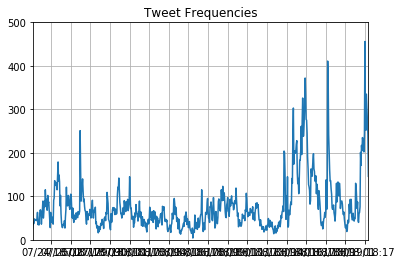

In [9]:
# Time series

# Adapted from "Mastering Social Media Mining with Python" - Marco Bonzanini, 2016

all_dates = []
for tweet in filtered_data:
    all_dates.append(tweet.get('created_at'))
    
all_dates[:10]

ones = np.ones(len(all_dates)) #crate array of 1s
idx = pd.DatetimeIndex(all_dates) #pandas series is indexed by the createion time, which is rperesented at idx

my_series = pd.Series(ones, index=idx) #before resampling
per_hour = my_series.resample('60Min', how='sum').fillna(0) #after resampling in buckets per hour

print(my_series.head())
print(per_hour.head())

fig, ax = plt.subplots()
ax.grid(True)
ax.set_title("Tweet Frequencies")
        
hours = mdates.MinuteLocator(interval=2400)
date_formatter = mdates.DateFormatter('%D:%H')


datemin = datetime(2018, 7, 22, 12, 0)
datemax = datetime(2018, 8, 19, 23, 0)

# datemin = datetime(2015, 10, 31, 15, 0)
# datemax = datetime(2015, 10, 31, 18, 0)

ax.xaxis.set_major_locator(hours)
ax.xaxis.set_major_formatter(date_formatter)
ax.set_xlim(datemin, datemax)
max_freq = per_hour.max()
ax.set_ylim(0,500)
ax.plot(per_hour.index, per_hour)

plt.rcParams["figure.figsize"]= [32,18]

plt.savefig('tweet_time_series.png')

In [10]:
# Hashtags & wordcloud

# Adapted from "Mastering Social Media Mining with Python" - Marco Bonzanini, 2016
# %load twitter_hashtag_frequency
# Chap02-03/twitter_hashtag_frequency.py

import sys
from collections import Counter
import json

def get_hashtags(tweet):
    entities = tweet.get('entities', {}) #we cannot access directly in case it is empty: key error. That's why .get.
    hashtags = entities.get('hashtags', [])
    return [tag['text'].lower() for tag in hashtags]

from collections import Counter
hashtags = Counter()

for tweet in filtered_data:
    hashtags_in_tweet = get_hashtags(tweet)
    hashtags.update(hashtags_in_tweet)
    
for tag, count in hashtags.most_common(15):
    print("{}: {}".format(tag, count))    

# zij hebben Json op ander formaat: zij loopen door regels, ik open het bestand, parsen en loop door de list.

palmoil: 18395
sawitbaik: 6535
biodieselhematdevisa: 1964
orangutans: 1786
plantation: 1461
orangutan: 1221
environmentdefenders: 1176
deforestation: 1065
worldorangutanday: 952
elephants: 808
indonesia: 722
rainforest: 651
orangutanday: 642
wildlife: 585
rspo: 584


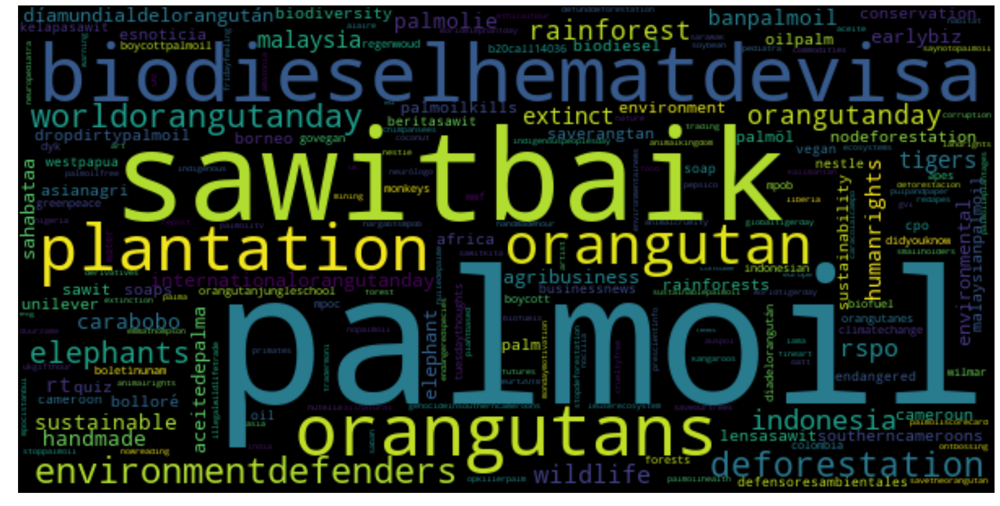

In [11]:
# Hashtag frequency 

import matplotlib.pyplot as plt
from wordcloud import WordCloud

wordcloud = WordCloud(width=600, height=300) # hier size aanpassen
wordcloud.generate_from_frequencies(frequencies=hashtags) #hashtags is een counter met alle woorden genormalizeerd, zie beneden
plt.figure()
plt.imshow(wordcloud, interpolation="bilinear")

plt.axis("off")
plt.show()

In [12]:
# Word Frequency & word coud

# Adapted from "Mastering Social Media Mining with Python" - Marco Bonzanini, 2016
# %load twitter_term_frequency.py
# Chap02-03/twitter_term_frequency.py

import sys
import string
import json
from collections import Counter
from nltk.tokenize import TweetTokenizer
from nltk.corpus import stopwords

import nltk
# nltk.download('stopwords')
  

def process(text, tokenizer=TweetTokenizer(), stopwords=[]):
    """Process the text of a tweet:
    - Lowercase
    - Tokenize
    - Stopword removal
    - Digits removal

    Return: list of strings
    """
    text = text.lower()
    tokens = tokenizer.tokenize(text)
    # If we want to normalize contraction, uncomment this
    tokens = normalize_contractions(tokens)
    return [tok for tok in tokens if tok not in stopwords and not tok.isdigit()]

def normalize_contractions(tokens):
    """Example of normalization for English contractions.

    Return: generator 
    
    Can be extended to include Twitter abbreviations. 
    """
    token_map = {
        "i'm": "i am",
        "you're": "you are",
        "it's": "it is",
        "we're": "we are",
        "we'll": "we will",
    }
    for tok in tokens:
        if tok in token_map.keys():
            for item in token_map[tok].split():
                yield item
        else:
            yield tok

tf = Counter()
tweet_tokenizer = TweetTokenizer()
punct = list(string.punctuation)
# one er ook uitgehaald, new ook (zie onderaan, over een 'new report')
stopword_list = stopwords.words('english') + stopwords.words('dutch') + stopwords.words('spanish') + punct  + ['rt','…','’','...', '–', 'one', 'new']        

for tweet in filtered_data:    
    tokens = process(text=tweet.get('text', ''),tokenizer=tweet_tokenizer,stopwords=stopword_list) 
    tf.update(tokens)
for tag, count in tf.most_common(15):
    print("{}: {}".format(tag, count))

oil: 46615
palm: 46576
#palmoil: 18418
destroyed: 7923
aceite: 7765
palma: 7656
orangutans: 6860
@bpdp_sawit: 6715
#sawitbaik: 6535
way: 5712
@rspotweets: 5476
forest: 4944
indonesia: 4828
@indofood: 4544
make: 4418


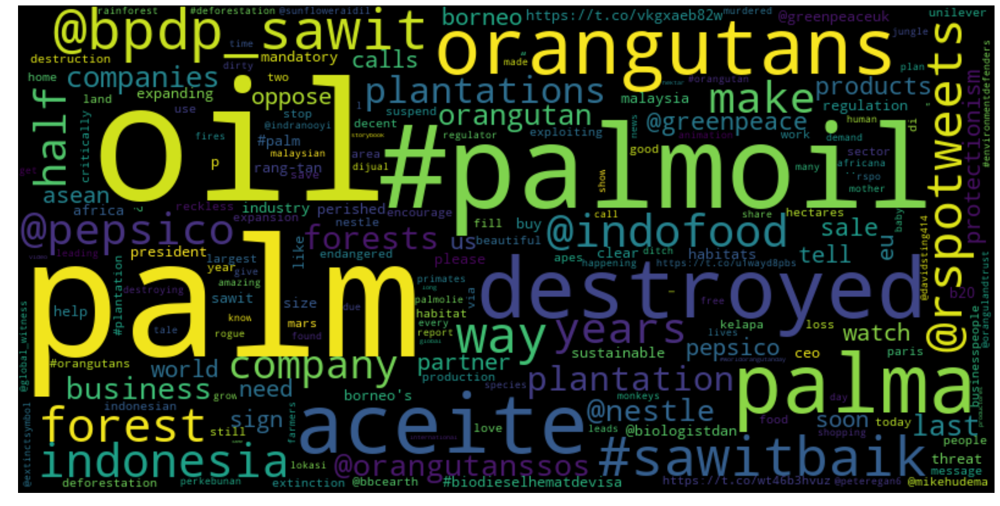

In [13]:
import matplotlib.pyplot as plt #nieuw
from wordcloud import WordCloud

wordcloud = WordCloud(width=800, height=400) # hier size aanpassen
wordcloud.generate_from_frequencies(frequencies=tf) #tf is een counter met alle woorden genormalizeerd, zie beneden
plt.figure()
plt.imshow(wordcloud, interpolation="bilinear")

plt.axis("off")
plt.show()

# Driving the Debate

In [14]:
# Most frequently retweeted tweets

from collections import Counter

retweets = []
retweets_tweets = []
beide=[]

for tweet in filtered_data:
    if ('retweeted_status' in tweet.keys()):
        user_name = tweet['retweeted_status']['text']
        retweets.append(user_name)
        retweets_tweets.append(tweet)

        
x = Counter(retweets)

x.most_common()

[('Indonesia Calls ASEAN, EU to Oppose Protectionism on Palm Oil https://t.co/vkGXAeB82W #SawitBaik  #PalmOil',
  2409),
 ('President to Sign Regulation on Expanding Mandatory B20 Soon https://t.co/Wt46b3HvuZ #SawitBaik #BiodieselHematDevisa #PalmOil #OilPalm',
  1947),
 ('Watch this...Rang-tan is a message to us all. Forests are being destroyed to clear the way for palm oil plantations… https://t.co/HluO0wrwzL',
  1589),
 ('Businesspeople Encourage Decent Work in Palm Oil Sector https://t.co/U1wayD8PBS #SawitBaik #PalmOil',
  1267),
 ("More than half of Borneo's orangutans have perished in the last 20 years; their habitats destroyed to make way for… https://t.co/F0STRaZOgF",
  1176),
 ('One palm oil company has destroyed an area of forest half the size of Paris. \n\nPepsiCo, Mars, Nestle, Unilever - co… https://t.co/vYDHSAOp9j',
  808),
 ('What’s happening to the Indonesian jungle is deeply worrying. But a palm oil plantation is up for sale &amp;… https://t.co/IGldpl7GVK',
  764),
 ('

## Construct 1: Twitter is an incarnation of the Habermasian public sphere

### 1. Social Inequalties are Bracketed - Part 1 - Network

In [15]:
reply_list = []

# Report most common user-names
for tweet in data:
    if ('user' in tweet.keys()):
        user_name = tweet['user']['screen_name']
        reply = tweet['in_reply_to_screen_name']
        
        if (reply != None):
            edge = [user_name,reply]
            reply_list.append(edge)

# sorted(reply_list)

In [16]:


import networkx as nx

# the undirected graph
N = nx.Graph()

for edge in reply_list:
    a = edge[0]
    b = edge[1]
    print(a)
    N.add_node(a)
    N.add_node(b)
    
    if (N.has_edge(a,b)):
        N[a][b]['weight'] += 1
    else:
        N.add_edge(a,b,weight=1)


hudsonlighting
Manoli54057614
phoonteckman
LMunchy
lozrozable
mikeyb7248_burt
leglaneur1
paveanthen
leglaneur1
paulinehollywoo
leglaneur1
CadburyUK
Lacaidaenpicado
lynnietay
GAR_Sinarmas
OA306
RunningBoundary
Phacemag
goldenveroleum
mnoornabila
elsamnews
elsamnews
zainikasmin1
DrKOS
KazzaH69
dreateran
hongwaionn
tiaramrie
_Anunnery
rhemygreat
MrWoodface
ochichiri
Laracroft4real
purabibose
purabibose
NathanL76721874
alemo781
Inongo_
beauty2xcel
NickyAACampbell
aashrafz
cawulor
swvixens
Co0ontje
MaryHide
jacqui703
Quintil3
maferchalo
skepticafro
WaterNymph91
AnthonyVeerayan
sm4357Xslow
JulienBittel
G00dEgg
principe_es
principe_es
TIBETALIA
rajomargon
Con_ConUK
hdot42
missyuwaaw
MJ_Metzger
_NiaAgustin_
Aanblast
ArShandis
Atoy_M
dinata_eva
BagusMbatu
nrulmstafa
MDSAVEearth
ahmadkelik
BudiAfidz_
clopby
co_kunam99
darminan1
Dewi_F99
DiazM9_
Tokyo_Tom
KilsonDangkat
ismanto_danie
_Riko_Trendy
AlkholisBaroroh
_Richo_
Novie_iz
Itihi_ha
loncengonline
FatchurRochman_
Gambit_Marv
loncengonline
hann

CUMSPITTER555
brainconductor
MarcoAPinoM
tj4616
quanjamindeus
AlanBixter
Yo_Dolphin
Creagh_Dubh
srirom
pusphavenkat
Renkema87
BI_Creezy
Walter_MS
WillJorSaund
ge_kaitlyn
ge_kaitlyn
ejike_umejiaku
paulinewriter
WillJorSaund
lqmnraof
UnileverNL
Alex_Avalon777
Da2318Lin
LeclercVicky
haaije69
NWarind
lachicabipolar
lolaloveandart
Rubrum_Cato
ObotUbong
Snyders_Hanover
Rubrum_Cato
thelostbeaver
NotLemontbh
Richardo_ElToro
ellehitter
Carlos_Apresa
vitroveritasbcn
kittykook
_life_imperfect
oraeekene
KabambaBupe
amachefe
_life_imperfect
hajarrre
oraeekene
nydiaoaxaqui1
Dunnasead
marte_un
megsmaixo
RSPOtweets
RSPOtweets
mattstruebig
pras4net
RSPOtweets
vegantuckbox
RRich007007
elephantfamily
raskivol
pajaritoporaqui
turtlechica
Potent_llama
kikelt_
pajaritoporaqui
nazani14
_life_imperfect
geiger_harald
Juanma_Saez
engcountrylife
tuinvosje
celestevivian_
LynneMimayan
LowrieJohn
iake
ryan_enviro001
Luuciiiaaa22
sunfloweraidil
ryan_enviro001
MalissaHamid
tjipkoopmans
MarthaOnoriode
sainsburys
jairo

Playm8z
HenryDuffman
yermaster16
RSPOtweets
Nestle
RSPOtweets
catacerca
armored_gold
NegeriBoneka
OatlyUK
OatlyUK
ajaygautamNBT
HoyosDuvan
IamMikkyPel
HamdaniDanyaal
bee_sav
susanhills1
Bornterra
NO_ORDINARYMAN
Mhortara
yofellowlazyass
daliarodriguezt
SueLees5
sekere_111
kathleenh254
iam_mrdynamic
GardenGourmetUK
FOURPAWSUSA
CapitanBochorno
ThePMSAvenger
1stroyalty_ng
Tesco
RSPOtweets
NatoliRoberta
Ayobamiwale2
MPazderkova
RSPOtweets
andee_kayy
RSPOtweets
FalguiAnna
RSPOtweets
Oxfordite
Letigadi93
sylvskitty
GKEnviro
SineadForan_
Appalini
gabyepstein21
Cave_DweIIer
ImogeneTheVQ
je_suis_dave
TerryH2o
lcookson3
RenevDeuren
om_idowu
JBNotes
PaulMinshull4U
Niyih
gosia_raus
mja2705
Wandile72
samfeelme
emmavallespinos
PCSoblahdeehell
begoodtonature
vembriwaluyas
tatzanx
OWS444
gosia_raus
BhupenderSP
jim_eatwell
emmy_dann
imtiazlalji
susan_bagheri
SAMURAI_SENPAI
samfeelme
hmgpepple
Sincelejosincor
mace02thangz
thekristen999
tsuga_wilson
davidnuneza
Onyi_Estelle
La_Zairoise
rpujolvives
Will_Sa

sebastian0922
Hisyam1700
hannahnannna
Deth2Fascists
lbernicker
hannahnannna
aitch_eyes
EahDeGrauwe
wwkeyboard
nathalie_tachet
AlejandroSo12
veganoyo
hardcorerox
greenkeizai
sirhidb
deeJaeIbbo
drawthecircle
tiggerthedog
Melis72Cares
nahhaal
greenkeizai
naturalkitchen7
LesJohnsonHrvat
MeReachingout
DoroSchreier
Rah_Zaq
NesonXS
markmoreve
timiochukwu
DerekPa16641676
Pasaatituuli
danielduchon
phizerkay
Enderh5
ElleninAnger
Lyricul_Miracle
greenpeeptoes
greenpeeptoes
AliaPikeNTC
Serec_Fourmyle
calvinwm
Temitayoo_
bramberkhout
JonathanOBrie12
hongwaionn
SINOPE413
ZisforZombie
ZisforZombie
estebanOrdnz
mrs_pickles
historiasfumada
DDunshaggin
mohd7959
Sally8229650811
HollowayKarin
NEVegans
CMYTDA
animolenikun
animolenikun
W4nderer_
sainsburys
Marco_da_Zena
MotyaReinhard
marksandspencer
cookster101
MsFoyin
AdamFMcGregor
shannon99jl
naturealert3
Dubi_di
SINOPE413
prmay
OfozoD12
himalaynff
Benefit_Network
ife_treaty
cumunolimbx
SilverQueen7
JanitorOrange
palmfreecouncil
rbarbozasosa
SridharUS
ser

FolabiWilliams
mskimgiambrone
DontBuyMurder
CaracolRadio
gcvrsa
AshleyBrownHair
putraditama
Nkruif
lindavanstrien
FullWoman27
JulioRodMi
4low_for_4low
stramashtoo
Nutriciavoorjou
Chidori_01
twuso
Orlamma1
_thePAL
Tatts2007
CodreCris
agrogenomica
munonoke
oxygindesign
MeJonnyBravo
dairymanNZ
stewartboyle4
thewicorman
WoudloperArend
logan7823
theendnottheend
9Redah
nadamatic11
its_outta_here
VectorToHeavens
artbyailbhe
charygar
WoudloperArend
brodiegal
brodiegal
henkmulder84
theresa11560012
qumran98
TheAssistantBoo
GreenInTheGrey
Gary_Morga
nadamatic11
loncengonline
loncengonline
AKondakor
loncengonline
robyn_goch
sonia_uzama
ariangel456
blancheboomla_
Karmageddon67
Balaji04797180
blancheboomla_
ariangel456
PurplePlanet01
lisa_martin13
blueshamrock84
OrchidSands
SunshineLeft
borshiregar1805
PLPG
HiiRobert
SaptoAdi_07
Diegotoch
BanGelder
Widhaa04
jennahirth
dewiamalia786
dewiamalia786
garygoodenough
yunita82tbn
yunita82tbn
gusnaidi18
bisuk
MBAKWATI3
PresidentISP
sarawake63
kurumi_eba
_ich

Real_KING101
nicolasnicola22
Karmageddon67
Ronnie_Rash
Ozzy6196
orangutans
mrymschfr
HeatherVGodfrey
xlpiano
matkampong
athenatradewind
Desiree_Laverne
alpha_wolfy_98
suhailalia1
nypa_ipowners
flickafaida
2covet
OrlandoBeltranQ
sabarr2017
PINDFoundation
YokoSuzukiJP
NathanBLawrence
Julie_B92
2covet
dairymanNZ
marksandspencer
daisyblade
BwwsAgency
LostArcNZ
Ajinomoto62
VishOnAMish
myloveishemp
Ajinomoto62
begoodtonature
paulusvangent
Botanygeek
BischofNiemz
Moosterpher2
greencatherine
marksandspencer
TheCelesteRose
greencatherine
Gr3ffi
MacBigfoot
Teresa_trad
okekepolice
Bouncehead
LilyCooper22
LilyCooper22
grammar_perkasa
alba_awesome
grammar_perkasa
WYS1WYG
bammylola
nypa_ipowners
i_rahmatt
adosa9shedur11
cuarentaman
cuarentaman
cuarentaman
JafesMorris
PeteHullah
1ManCabal
thomas_cryptom
Iris_Latifolia
OMGitsVykkye
CrabtreeJim
Mohamed09231539
adriaankeij
Pinolake
Revkin
RedGelderland
Karmageddon67
GenBlackHawk
jahkels_inc
MimsyYamaguchi
KadekPurwanti
ReniHerlina12
Karmageddon67
Farizz

Lolo_cy
robbie_andrew
marksandspencer
orangulandtrust
sainsburys
villa1st
vuterlanik
robbie_andrew
Meldawson6
kjsve
baboOu__
barryheadwound
Peters_Glen
PepsiCo
PepsiCo
RSPOtweets
FionaGooch
RSPOtweets
xxmiekewxx
RSPOtweets
velamoran
Javi_Gentleman
FabsCFC
voedingscentrum
sinrendicion65
Jadelotus5
AnthonyVeerayan
poligrow
GreggsOfficial
FoodieScottish
equal_o_not
anhrflrn
anis__aa
HjalteOlsen
Nick_HurstRPG
armahkenneth_
nococonut
CarmodyDeidre
Random832
bcrennn
TimTam_US
onyibueze2002
suki_yntema
AnnemiekeVoorn
I_pissVodka
Sethe3rd
CrozierMark
NutellaGlobal
Lorrylou2u
joeyc9411
JustIsabelle
petrusvandijk
kittykook
marksandspencer
nyukevo
iamKvngAce
WheelSkills
Tighza_Taza
Beebee__Em
dami_speaks
KimAglioti
dami_speaks
doodlebug0
nyukevo
Freja_Petersen
DPP_FSPS
JunaidiPayne
tutugroovy
Nutkin_GQWP
goredone1
stupotcollier
knipoog50
continentspirit
knipoog50
caitlin_m_ryan
MoreOurselves
JeromeAbbassene
Burwelsh
dolochoquerita
AldiUK
LimAiYim
NaOyoe
alward4461
LimAiYim
Ultimohumano
Patri6
Lim

In [17]:
giant_reply = max(nx.connected_component_subgraphs(N), key=len)
max(nx.connected_component_subgraphs(N), key=len)
nx.info(giant_reply)

'Name: \nType: Graph\nNumber of nodes: 1723\nNumber of edges: 1924\nAverage degree:   2.2333'

CPU times: user 13 s, sys: 140 ms, total: 13.2 s
Wall time: 13.5 s


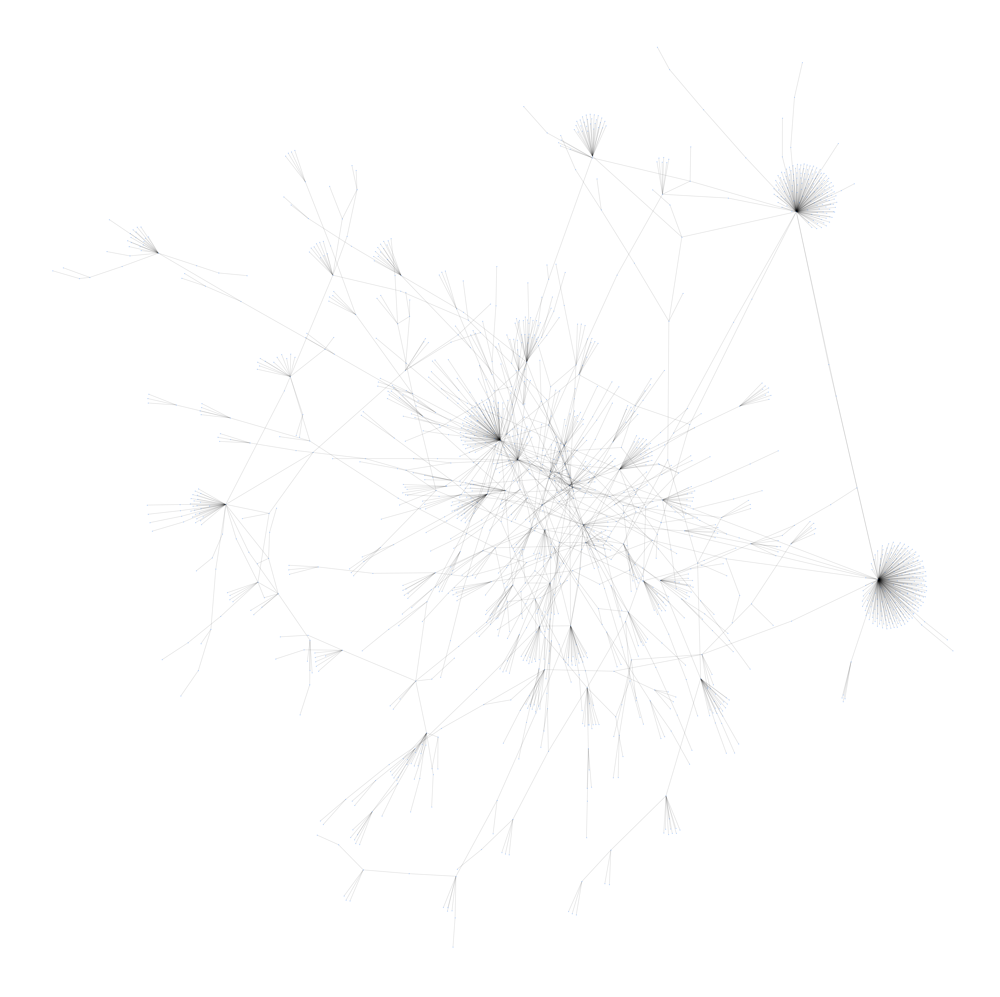

In [20]:
%%time

import pylab
import matplotlib.pyplot as plt

%matplotlib inline
#pylab.rcParams['figure.figsize'] = (24, 24)

# set the graphic inline in screen
# set the figure size
%matplotlib inline
plt.figure(figsize=(70,70))

# do some layouts
pos1=nx.fruchterman_reingold_layout(giant_reply)

# set the labels, draw the graph
# nx.draw_networkx_labels(giant_reply,pos1)
nx.draw(giant_reply,pos1,node_size=10,node_color='#0066FF',alpha=0.35)

plt.savefig("giant_reply2.png", format="PNG")
# nx.savefig('giant_reply.png')

In [23]:
# sublist[0] is pepsico eerst, sublist [1] is P_R_Ansell eerst. Het is dus volgens mij [van, aan]

count=0
for sublist in reply_list:
    if sublist[0] == 'PepsiCo':
        count+=1
        #print ( "Found it!", sublist)
        # break
        
print(count)

69


### 1. Social Inequalities are Bracketed - Part 2 - Influencers

In [3]:
# user_mentions represents other Twitter users mentioned in the text of the Tweet.

# Adapted from "Mastering Social Media Mining with Python" - Marco Bonzanini, 2016
# %load twitter_mention_frequency.py
# Chap02-03/twitter_mention_frequency.py

import sys
from collections import Counter
import json

def get_mentions(tweet):
    entities = tweet.get('entities', {})
    hashtags = entities.get('user_mentions', [])
    return [tag['screen_name'] for tag in hashtags]


users = Counter()
for tweet in filtered_data:    
    mentions_in_tweet = get_mentions(tweet)
    users.update(mentions_in_tweet)
    
for user, count in users.most_common(10):
    print("{}: {}".format(user, count, ))
    

bpdp_sawit: 6715
RSPOtweets: 5476
indofood: 4544
PepsiCo: 4260
OrangutansSOS: 3263
Nestle: 3235
Greenpeace: 2990
GreenpeaceUK: 2283
BiologistDan: 1995
MikeHudema: 1731


In [22]:
# Most frequently retweeted tweets

from collections import Counter
retweets = []

for tweet in filtered_data:
    if ('retweeted_status' in tweet.keys()):
        user_name = tweet['retweeted_status']['text']
        retweets.append(user_name)

        
x_retweets = Counter(retweets)

x_retweets.most_common(10)

[('Indonesia Calls ASEAN, EU to Oppose Protectionism on Palm Oil https://t.co/vkGXAeB82W #SawitBaik  #PalmOil',
  2409),
 ('President to Sign Regulation on Expanding Mandatory B20 Soon https://t.co/Wt46b3HvuZ #SawitBaik #BiodieselHematDevisa #PalmOil #OilPalm',
  1947),
 ('Watch this...Rang-tan is a message to us all. Forests are being destroyed to clear the way for palm oil plantations… https://t.co/HluO0wrwzL',
  1589),
 ('Businesspeople Encourage Decent Work in Palm Oil Sector https://t.co/U1wayD8PBS #SawitBaik #PalmOil',
  1267),
 ("More than half of Borneo's orangutans have perished in the last 20 years; their habitats destroyed to make way for… https://t.co/F0STRaZOgF",
  1176),
 ('One palm oil company has destroyed an area of forest half the size of Paris. \n\nPepsiCo, Mars, Nestle, Unilever - co… https://t.co/vYDHSAOp9j',
  808),
 ('What’s happening to the Indonesian jungle is deeply worrying. But a palm oil plantation is up for sale &amp;… https://t.co/IGldpl7GVK',
  764),
 ('

In [15]:
# To find a user of the most frequently retweeted tweets:

text = 'Indonesia Calls ASEAN, EU to Oppose Protectionism on Palm Oil'
count = 0

popular_retweeter = []

for tweet in filtered_data:
    if text in tweet['text']:
        popular_retweeter.append(tweet['entities']['user_mentions'])

popular_retweeter[:1] #suboptimaal

[[{'id': 131645726,
   'id_str': '131645726',
   'indices': [3, 14],
   'name': 'BPDP Kelapa #SawitBaik',
   'screen_name': 'bpdp_sawit'}]]

### 3.  Access is granted to all citizens - Most common user names


In [17]:
# Most tweets in this database


users = []

for tweet in filtered_data:
    if('user' in tweet.keys()):
        users.append(tweet['user']['screen_name'])
            

from collections import Counter

x = Counter(users)
x.most_common(60)

[('sawitmedia', 1484),
 ('sathia_varqa', 471),
 ('RSPOtweets', 345),
 ('orangulandtrust', 230),
 ('DVIINGENIERIA', 224),
 ('paspi_sawit', 221),
 ('orangutans', 215),
 ('my_mpi', 198),
 ('Tweets4Vegans', 167),
 ('davidsting414', 164),
 ('DrBirute', 162),
 ('mpocHQ', 154),
 ('setyourmindfree', 144),
 ('NWarind', 138),
 ('wahyudin_ihsan', 133),
 ('altischeah1', 132),
 ('MPOCEurope', 125),
 ('JDobroszczyk', 123),
 ('BlesynAffia', 118),
 ('yobeahrs', 106),
 ('Meldawson6', 99),
 ('tweetmasterone', 94),
 ('GAR_Sinarmas', 89),
 ('petrusvandijk', 88),
 ('Nigeblue', 85),
 ('mpob_tweets', 85),
 ('infosawit', 81),
 ('HiiRobert', 71),
 ('LilaFlw', 70),
 ('PepsiCo', 69),
 ('nicolasnicola22', 67),
 ('theedgemarkets', 65),
 ('JJ_Angelus', 65),
 ('AlekseyUdovenko', 62),
 ('blanketcrap', 62),
 ('Nina_Ella_', 59),
 ('foe_us', 59),
 ('99TheIdealist', 59),
 ('Anchi46', 57),
 ('Karmageddon67', 56),
 ('Voice4_nature', 54),
 ('coconutblush', 52),
 ('KahmiNasional', 51),
 ('BlueSeas111', 50),
 ('occupy4eles', 

### 4. Those forming public opinion are presupposed reasonable

In [23]:
retweets = pd.DataFrame.from_dict(x_retweets.most_common(10))
retweets = retweets.rename(index=int, columns={0 :'Text', 1:'Number of Retweets'})
#retweets.rename?
retweets

,Text,Number of Retweets
0,"Indonesia Calls ASEAN, EU to Oppose Protection...",2409
1,President to Sign Regulation on Expanding Mand...,1947
2,Watch this...Rang-tan is a message to us all. ...,1589
3,Businesspeople Encourage Decent Work in Palm O...,1267
4,More than half of Borneo's orangutans have per...,1176
5,One palm oil company has destroyed an area of ...,808
6,What’s happening to the Indonesian jungle is d...,764
7,This is a brilliant idea not a storybook tale....,745
8,"This is a Tarsier. They live in Malaysia, Phil...",703
9,This beautiful animation will show you how pal...,674


In [25]:
# tests voor subjectivity
# Sentiment Analysis
# Polarity [-1,1]: 1 is postive, -1 negative
# Subjectivity [0,1]: 1 is subjective (opinion)

from textblob import TextBlob
retweets

def sent_p(string):
    return TextBlob(string).sentiment.polarity

def sent_s(string):
    return TextBlob(string).sentiment.subjectivity

retweets["Polarity"] = retweets.Text.apply(sent_p)
retweets["Subjectivity"] = retweets.Text.apply(sent_s)



retweets

,Text,Number of Retweets,Polarity,Subjectivity
0,"Indonesia Calls ASEAN, EU to Oppose Protection...",2409,0.000000,0.000000
1,President to Sign Regulation on Expanding Mand...,1947,0.000000,0.000000
2,Watch this...Rang-tan is a message to us all. ...,1589,0.100000,0.383333
3,Businesspeople Encourage Decent Work in Palm O...,1267,0.166667,0.666667
4,More than half of Borneo's orangutans have per...,1176,0.111111,0.244444
5,One palm oil company has destroyed an area of ...,808,-0.166667,0.166667
6,What’s happening to the Indonesian jungle is d...,764,0.000000,0.400000
7,This is a brilliant idea not a storybook tale....,745,0.900000,1.000000
8,"This is a Tarsier. They live in Malaysia, Phil...",703,0.028788,0.633333
9,This beautiful animation will show you how pal...,674,0.850000,1.000000


## Construct 2. Twitter causes a fragmentation of the public

In [56]:
import pandas as pd
df = pd.DataFrame.from_dict(filtered_data)

print(df.shape)

(101902, 36)


In [57]:
df = df.drop_duplicates(subset=['text'])
df.shape 
df = df[:200000]  #make bigger

In [51]:
from sklearn.pipeline import Pipeline
from sklearn.cluster import KMeans
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import FunctionTransformer, StandardScaler
from umap import UMAP

In [58]:
%%time 


pl = Pipeline([
    ('cv', TfidfVectorizer(stop_words='english', max_df=.3, min_df=10)),
    ('densify', FunctionTransformer(lambda x: x.todense(), accept_sparse=True)),
    ('umap', UMAP())
])

coordinates_umap = pl.fit_transform(df['text'])

/anaconda3/lib/python3.6/site-packages/umap/spectral.py:229: UserWarning: Embedding 195 connected components using meta-embedding (experimental)
  n_components
/anaconda3/lib/python3.6/site-packages/umap/spectral.py:182: UserWarning: WARNING: spectral initialisation failed! The eigenvector solver
failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!
  "WARNING: spectral initialisation failed! The eigenvector solver\n"


CPU times: user 2min 54s, sys: 8.4 s, total: 3min 2s
Wall time: 2min 53s


In [32]:
from bokeh.plotting import figure, show
from bokeh.io import output_notebook
from bokeh.models import ColumnDataSource, HoverTool
from bokeh.transform import transform
import bokeh
output_notebook()

Loading BokehJS ...

In [59]:
df_umap = df.assign(
    x=coordinates_umap[:,0],
    y=coordinates_umap[:,1]
)

In [60]:
df_to_use = df_umap

# Put the data into a Bokeh "ColumnDataSource" that it uses for plotting and showing tooltips
source = ColumnDataSource(
    data=dict(        
        x=df_to_use.x, # first dimension of projection
        y=df_to_use.y, # second dimension of projection
        text_short=df_to_use['text'].str.slice(0,100) + '...', # first 150 chars of text
    )
)

# Create a Bokeh HoverTool object for showing tooltips with information in the ColumnDataSource
hover = HoverTool(tooltips=[
    ("text", "@text_short"), # show contents of text_short column in the tooltip
]) 

# Define interactivity tools to add to the Bokeh plot
tools = "pan,wheel_zoom,box_zoom,reset"

# create a bokeh figure with some settings and interactivity tools
p = figure(plot_height=400, sizing_mode='scale_width', title='UMAP of tweets', tools=tools)
p.add_tools(hover)

# Create a scatter plot, refering to the data in the ColumnDataSource
p.circle(
    source=source, # our ColumnDataSource
    x="x", y="y", # projection coordinates
    size=6, 
    fill_alpha=0.5,
    line_color='black');

In [61]:
show(p)

In [35]:
# to check out a specific words

check_text = []

for tweet in filtered_data:
    if('text' in tweet.keys()):
        if 'cosmetics' in tweet['text']: # this works for 
            check_text.append(tweet['text'])
            
            
check_text

['RT @dwnews: Palm oil can be used in everything from cosmetics to fuel, and is cheap and efficient to produce. \n\nBut this versatile crop has…',
 'RT @dwnews: Palm oil can be used in everything from cosmetics to fuel, and is cheap and efficient to produce. \n\nBut this versatile crop has…',
 'RT @dwnews: Palm oil can be used in everything from cosmetics to fuel, and is cheap and efficient to produce. \n\nBut this versatile crop has…',
 'RT @dwnews: Palm oil can be used in everything from cosmetics to fuel, and is cheap and efficient to produce. \n\nBut this versatile crop has…',
 'RT @dwnews: Palm oil can be used in everything from cosmetics to fuel, and is cheap and efficient to produce. \n\nBut this versatile crop has…',
 'RT @dwnews: Palm oil can be used in everything from cosmetics to fuel, and is cheap and efficient to produce. \n\nBut this versatile crop has…',
 "RT @brodiegal: Busy updating breakfast cereals on our 'palm oil' list for ZA grocery products &amp; cosmetics. \n\nN

In [ ]:
# to check out a specific tweet

check_tweet = []

for tweet in filtered_data:
    if('text' in tweet.keys()):
        if '@natalieben I totally agree, and how many people buy' in tweet['text']: # this works for 
            check_tweet.append(tweet)
            
            
check_tweet